## **Problem Statement**

One of India's largest fresh produce supply chain company pioneers in solving one of the toughest supply chain problems of the world by leveraging innovative technology. They source fresh produce from farmers and deliver them to businesses within 12 hours. An integral component of their automation process is the development of robust classifiers which can distinguish between images of different types of vegetables, while also correctly labeling images that do not contain any one type of vegetable as noise.

As a starting point, company has provided us with a dataset scraped from the web which contains train and test folders, each having 4 sub-folders with images of onions, potatoes, tomatoes and some market scenes. We have been tasked with preparing a multiclass classifier for identifying these vegetables. The dataset provided has all the required images to achieve the task.



This dataset contains a folder train, which has a total of 3135 images, split into four folders as follows:

- Tomato : 789
- Potato : 898
- Onion : 849
- Indian market : 599

This dataset contains another folder test which has a total of 351 images, split into four folders

- Tomato : 106
- potato : 83
- onion : 81
- Indian market : 81

## **Importing the libraries**

In [ ]:
# Import common libraries
import os
import glob
import random
import shutil
import pydot
import graphviz
import datetime
import numpy as np
import pandas as pd
import sklearn.metrics as metrics
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(11)

# Import sklearn and it's modules
from sklearn.model_selection import train_test_split

# Import tensorflow and its modules
import tensorflow as tf
from tensorflow import keras
from keras import layers, regularizers
tf.keras.utils.set_random_seed(42) # set random seed

# To supress any warnings during the flow
import warnings
warnings.filterwarnings('ignore')

## **Importing the dataset**

In [ ]:
!gdown 1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT

Downloading...
From: https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT
To: /content/ninjacart_data.zip
100% 275M/275M [00:04<00:00, 62.7MB/s]


In [ ]:
!unzip /content/ninjacart_data.zip

Archive:  /content/ninjacart_data.zip
   creating: ninjacart_data/test/
   creating: ninjacart_data/test/indian market/
  inflating: ninjacart_data/test/indian market/bhl.jpeg  
  inflating: ninjacart_data/test/indian market/bhv.jpeg  
  inflating: ninjacart_data/test/indian market/bn.jpeg  
  inflating: ninjacart_data/test/indian market/hjx.jpeg  
  inflating: ninjacart_data/test/indian market/igis.jpeg  
  inflating: ninjacart_data/test/indian market/in.jpeg  
  inflating: ninjacart_data/test/indian market/india-4898453__340.jpg  
  inflating: ninjacart_data/test/indian market/indianmarket10.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket12.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket13.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket14.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket15.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket18.jpeg  
  inflating: ninjacart_data/test/indian market/

In [ ]:
old_name = r'/content/ninjacart_data/train'
new_name = r'/content/ninjacart_data/data_train'
os.rename(old_name, new_name)

In [ ]:
# Path to the training dataset directory
dataset_dir = '/content/ninjacart_data/data_train'

# Path to the test dataset directory
test_dir = '/content/ninjacart_data/test'

In [ ]:
train_class_dirs = os.listdir(f"{dataset_dir}") # list all directories inside "dataset" folder
test_class_dirs = os.listdir(f"{test_dir}") # list all directories inside "test" folder

train_image_dict = {} # dict to store image array(key) for every class(value) of train data
train_count_dict = {} # dict to store count of files(key) for every class(value) of train data

test_image_dict = {} # dict to store image array(key) for every class(value) of test data
test_count_dict = {} # dict to store count of files(key) for every class(value) of test data

image_dimensions = []

# iterate over all class_dirs for train data
for cls in train_class_dirs:

    # get list of all paths inside the subdirectory
    train_file_paths = glob.glob(f'{dataset_dir}/{cls}/*')

    # count number of files in each class and add it to count_dict
    train_count_dict[cls] = len(train_file_paths)

    # select random n items from list of image paths
    n_items = 5
    train_image_path = random.choices(train_file_paths, k=n_items)

    # load image using keras utility function and save it in image_dict
    train_random_image_list = []
    for i in range(n_items):
        train_random_image_list.append(tf.keras.utils.load_img(train_image_path[i]))
    train_image_dict[cls] = train_random_image_list

    for image_path in train_file_paths:
        img =  tf.keras.preprocessing.image.load_img(image_path)
        image_dimensions.append(img.size[:2]) # Extracting only the width and height

# iterate over all class_dirs for test data
for cls in test_class_dirs:

    # get list of all paths inside the subdirectory
    test_file_paths = glob.glob(f'{test_dir}/{cls}/*')

    # count number of files in each class and add it to count_dict
    test_count_dict[cls] = len(test_file_paths)

    # select random n items from list of image paths
    n_items = 5
    test_image_path = random.choices(test_file_paths, k=n_items)

    # load image using keras utility function and save it in image_dict
    test_random_image_list = []
    for i in range(n_items):
        test_random_image_list.append(tf.keras.utils.load_img(test_image_path[i]))
    test_image_dict[cls] = test_random_image_list

## **Exploratory Data Analysis**

### Plotting class distribution (Verify the count of images in each train and test data)

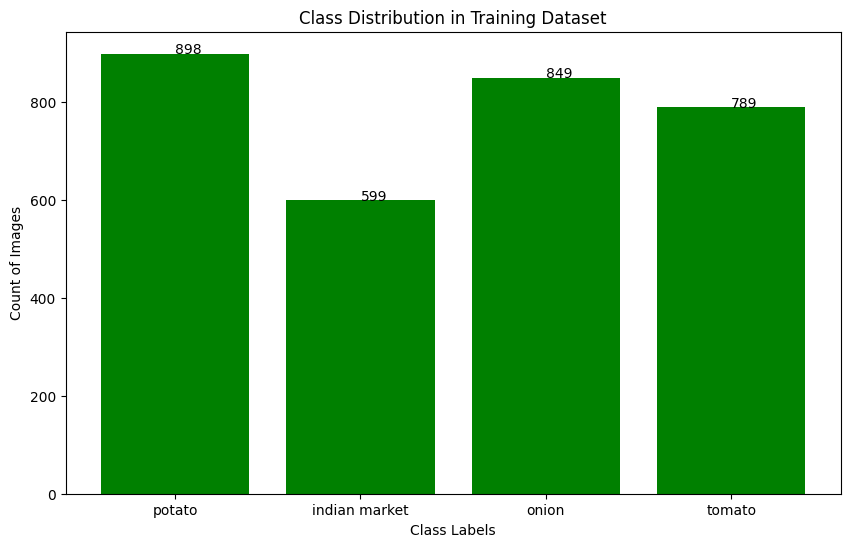

In [ ]:
train_unique_labels = list(train_count_dict.keys())
train_counts = list(train_count_dict.values())

plt.figure(figsize=(10, 6))
plt.bar(train_unique_labels, train_counts, color = "green")
plt.xlabel('Class Labels')
plt.ylabel('Count of Images')
plt.title('Class Distribution in Training Dataset')

for index, value in enumerate(train_counts):
    plt.text(index, value, str(value))
plt.show()

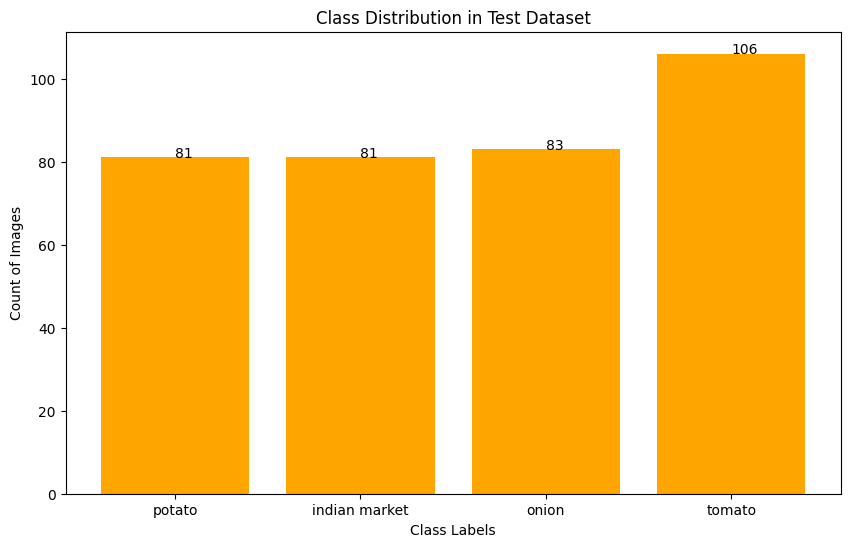

In [ ]:
test_unique_labels = list(test_count_dict.keys())
test_counts = list(test_count_dict.values())

plt.figure(figsize=(10, 6))
plt.bar(test_unique_labels, test_counts, color = "orange")
plt.xlabel('Class Labels')
plt.ylabel('Count of Images')
plt.title('Class Distribution in Test Dataset')

for index, value in enumerate(test_counts):
    plt.text(index, value, str(value))
plt.show()

### Visualizing Image dimensions with some random sample plots

In [ ]:
len(image_dimensions)

3135

In [ ]:
len(list(zip(*image_dimensions)))

2

minimum image height: 48
minimum image width: 48 

maximum image height: 4256
maximum image width: 6030


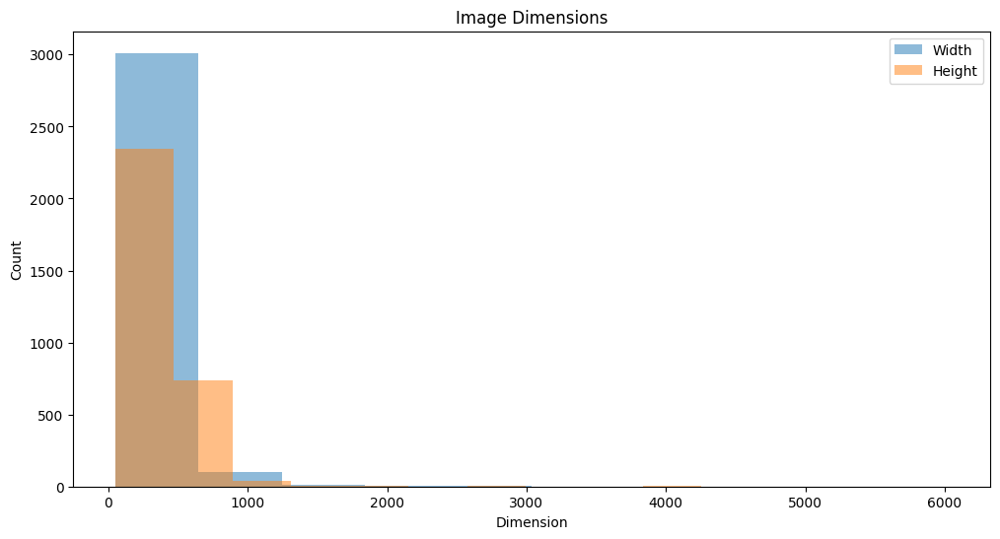

In [ ]:
widths, heights = zip(*image_dimensions)
print(f'minimum image height: {min(heights)}')
print(f'minimum image width: {min(widths)} \n')

print(f'maximum image height: {max(heights)}')
print(f'maximum image width: {max(widths)}')

plt.figure(figsize=(12, 6))
plt.hist(widths, alpha=0.5, label='Width')
plt.hist(heights, alpha=0.5, label='Height')
plt.xlabel('Dimension')
plt.ylabel('Count')
plt.title('Image Dimensions')
plt.legend()
plt.show()

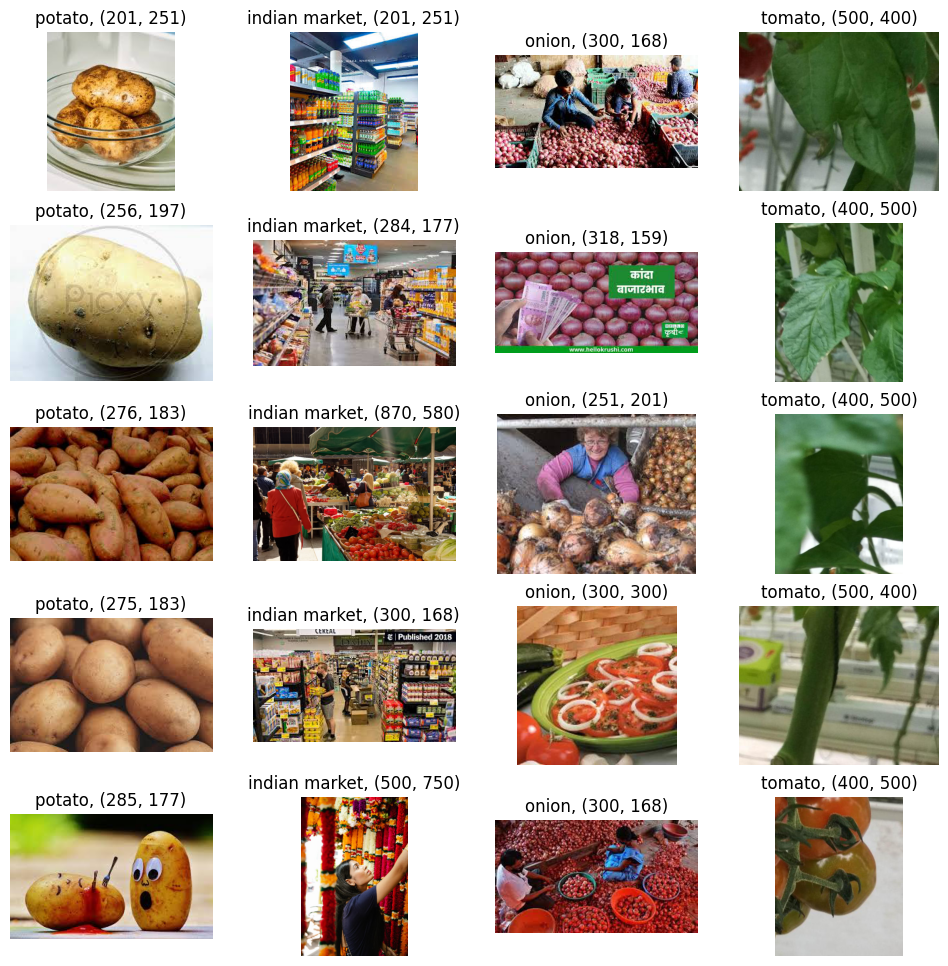

In [ ]:
## Viz Random n_items Samples from each class

# Create a grid plot with a n_items x n_class layout
fig, axs = plt.subplots(n_items, len(train_image_dict), figsize=(12, 12))

# iterate over dictionary items (class label, image array)
for i, (cls,img) in enumerate(train_image_dict.items()):
    for j in range(n_items):
        # Get the image at the corresponding position
        image = train_image_dict[cls][j]

        # Plot the image in the current grid cell
        axs[j, i].imshow(image)
        axs[j, i].axis('off')

        # set "class name" along with "image size" as title
        axs[j, i].set_title(f'{cls}, {image.size}')

### Splitting the dataset into train, validation, and test set

In [ ]:
# Path to the original dataset folder
dataset_folder = '/content/ninjacart_data/data_train'

# Path to the destination folders for training and validation sets
train_folder = "/content/ninjacart_data/train"
valid_folder = "/content/ninjacart_data/validation"

# Create the destination folders if they don't exist
os.makedirs(train_folder, exist_ok=True)
os.makedirs(valid_folder, exist_ok=True)

# Get the list of class subfolders
class_folders = [f for f in os.listdir(dataset_folder) if os.path.isdir(os.path.join(dataset_folder, f))]

# Iterate over each class folder
for class_folder in class_folders:
    # Path to the current class folder in the original dataset
    class_folder_path = os.path.join(dataset_folder, class_folder)

    # Path to the current class folder in the training set
    train_class_folder_path = os.path.join(train_folder, class_folder)

    # Path to the current class folder in the validation set
    valid_class_folder_path = os.path.join(valid_folder, class_folder)

    # Create the class folders in the training and validation sets if they don't exist
    os.makedirs(train_class_folder_path, exist_ok=True)
    os.makedirs(valid_class_folder_path, exist_ok=True)

    # List all image files in the current class folder
    # image_files = [f for f in os.listdir(class_folder_path) if f.endswith(".jpg") or f.endswith(".png") or f.endswith(".jpeg")]
    image_files = [imgfile for imgfile in glob.glob(f'{class_folder_path}/*')]

    # Split the image files into train and validation sets
    train_files, valid_files = train_test_split(image_files, test_size=0.2, random_state=42, shuffle=True)

    # Move the training files to the train folder
    for file in train_files:
        src = os.path.join(class_folder_path, file.split('/')[-1])
        dst = os.path.join(train_class_folder_path, file.split('/')[-1])
        shutil.copyfile(src, dst)

    # Move the validation files to the valid folder
    for file in valid_files:
        src = os.path.join(class_folder_path, file.split('/')[-1])
        dst = os.path.join(valid_class_folder_path, file.split('/')[-1])
        shutil.copyfile(src, dst)

In [ ]:
# Print the number of files in each set
length_dataset, length_train, length_valid = 0, 0, 0
for c in class_folders:
    length_dataset += len(os.listdir(os.path.join(dataset_folder, c)))
    length_train += len(os.listdir(os.path.join(train_folder, c)))
    length_valid += len(os.listdir(os.path.join(valid_folder, c)))

print(f"Training set size: {length_train} -->{round(length_train/length_dataset*100,0)}%")
print(f"Validation set size: {length_valid} -->{round(length_valid/length_dataset*100,0)}%")

Training set size: 2507 -->80.0%
Validation set size: 628 -->20.0%


In [ ]:
# Print the number of files in each class set
for c in class_folders:
    length_dataset_class = len(os.listdir(os.path.join(dataset_folder, c)))
    length_train_class = len(os.listdir(os.path.join(train_folder, c)))
    length_valid_class = len(os.listdir(os.path.join(valid_folder, c)))
    print(f"Training set size for {c}: {length_train_class} -->{round(length_train_class/length_dataset_class*100,0)}%")
    print(f"Validation set size for {c}: {length_valid_class} -->{round(length_valid_class/length_dataset_class*100,0)}%")
    print()

Training set size for potato: 718 -->80.0%
Validation set size for potato: 180 -->20.0%

Training set size for indian market: 479 -->80.0%
Validation set size for indian market: 120 -->20.0%

Training set size for onion: 679 -->80.0%
Validation set size for onion: 170 -->20.0%

Training set size for tomato: 631 -->80.0%
Validation set size for tomato: 158 -->20.0%



## **Creating model architecture and training**

### Loading dataset

In [ ]:
def load_data(base_dir="/content/ninjacart_data", BATCH_SIZE = 32):
    # checking if the data folders are present
    assert os.path.exists(f"{base_dir}/train") and \
    os.path.exists(f"{base_dir}/validation") and \
    os.path.exists(f"{base_dir}/test")

    print('\nLoading Train Data...')
    train_data = tf.keras.utils.image_dataset_from_directory(f"{base_dir}/train", shuffle=True, label_mode='categorical', seed=123, batch_size=BATCH_SIZE)

    print('\nLoading Validation Data...')
    val_data = tf.keras.utils.image_dataset_from_directory(f"{base_dir}/validation", shuffle=False, label_mode='categorical', seed=123, batch_size=BATCH_SIZE)

    print('\nLoading Test Data...')
    test_data = tf.keras.utils.image_dataset_from_directory(f"{base_dir}/test", shuffle=False, label_mode='categorical', seed=123, batch_size=BATCH_SIZE)

    return train_data, val_data, test_data, train_data.class_names

In [ ]:
train_data, val_data, test_data, class_names = load_data()


Loading Train Data...
Found 2507 files belonging to 4 classes.

Loading Validation Data...
Found 628 files belonging to 4 classes.

Loading Test Data...
Found 351 files belonging to 4 classes.


### Preprocessing the image : Resizing, Standardization

In [ ]:
def preprocess(train_data, val_data, test_data, target_height=128, target_width=128):

    # Data Processing Stage with resizing and rescaling operations
    data_preprocess = keras.Sequential(
        name="data_preprocess",
        layers=[
            layers.Resizing(target_height, target_width),
            layers.Rescaling(1.0/255),
        ]
    )

    # Perform Data Processing on the train, val, test dataset
    train_ds = train_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    val_ds = val_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)
    test_ds = test_data.map(lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE)

    return train_ds, val_ds, test_ds

In [ ]:
ip_height, ip_width = 128, 128
train_ds, val_ds, test_ds = preprocess(train_data, val_data, test_data, ip_height, ip_width)

In [ ]:
sample = next(iter(train_ds))[0]

print(sample)

tf.Tensor(
[[[[3.44764888e-01 5.27117848e-01 2.28098199e-01]
   [3.31824481e-01 5.15648007e-01 2.07804859e-01]
   [3.09073418e-01 4.94367570e-01 1.77700877e-01]
   ...
   [9.16245452e-04 5.72887994e-02 6.30840287e-03]
   [4.90196096e-03 4.75490242e-02 2.94117676e-03]
   [1.96078443e-03 4.16762419e-02 9.80392215e-04]]

  [[2.57093489e-01 4.16897416e-01 7.96425045e-02]
   [2.53921598e-01 4.14215714e-01 7.69607872e-02]
   [2.55939811e-01 4.16724145e-01 7.94692114e-02]
   ...
   [0.00000000e+00 1.68974046e-02 0.00000000e+00]
   [1.88706350e-03 1.47058833e-02 1.02941180e-02]
   [2.21066945e-03 1.98481549e-02 4.92110942e-03]]

  [[2.70773977e-01 4.29597527e-01 1.05087705e-01]
   [2.88023710e-01 4.37043339e-01 1.25278622e-01]
   [3.10903043e-01 4.50118750e-01 1.51099116e-01]
   ...
   [0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00]
   [0.00000000e+00 0.00000000e+00 0.00000000e+00]]

  ...

  [[6.48308277e-01 4.06901073e-03 2.45098048e-03]
   [6

### Defining the CNN Classifier model from scratch : Baseline Model

In [ ]:
%load_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_v0_ckpt/"
log_path = '/content/ninjacart_data/logs/model_v0_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
num_classes = 4
hidden_size = 64

model_v0 = keras.Sequential(
    name="model_cnn_baseline",
    layers=[
        layers.Conv2D(filters=16, kernel_size=3, strides=1, padding="same", activation='relu', input_shape=(ip_height, ip_width, 3)),
        layers.MaxPooling2D(),
        layers.Flatten(),
        layers.Dense(units=hidden_size, activation='relu'),
        layers.Dense(units=num_classes, activation='softmax')
    ]
)

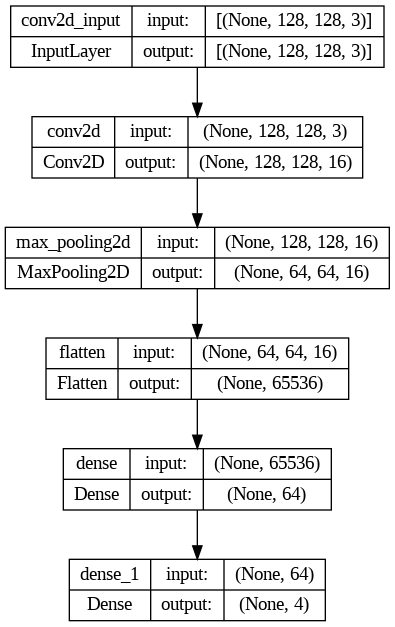

In [ ]:
tf.keras.utils.plot_model(model_v0, show_shapes=True)

In [ ]:
model_v0.summary()

Model: "model_cnn_baseline"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 64, 64, 16)       0         
 )                                                               
                                                                 
 flatten (Flatten)           (None, 65536)             0         
                                                                 
 dense (Dense)               (None, 64)                4194368   
                                                                 
 dense_1 (Dense)             (None, 4)                 260       
                                                                 
Total params: 4,195,076
Trainable params: 4,195,076
Non-trainable params: 0
______________________________________

In [ ]:
model_v0.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 10
model_v0_fit = model_v0.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=base_callbacks)

Epoch 1/10
79/79 [==============================] - 22s 130ms/step - loss: 1.0423 - accuracy: 0.6318 - top_3_accuracy: 0.9326 - val_loss: 0.6209 - val_accuracy: 0.7818 - val_top_3_accuracy: 0.9777
Epoch 2/10
79/79 [==============================] - 12s 145ms/step - loss: 0.5376 - accuracy: 0.8069 - top_3_accuracy: 0.9821 - val_loss: 0.5457 - val_accuracy: 0.8025 - val_top_3_accuracy: 0.9761
Epoch 3/10
79/79 [==============================] - 11s 133ms/step - loss: 0.3522 - accuracy: 0.8823 - top_3_accuracy: 0.9948 - val_loss: 0.4482 - val_accuracy: 0.8217 - val_top_3_accuracy: 0.9920
Epoch 4/10
79/79 [==============================] - 11s 133ms/step - loss: 0.2209 - accuracy: 0.9398 - top_3_accuracy: 0.9972 - val_loss: 0.4360 - val_accuracy: 0.8248 - val_top_3_accuracy: 0.9936
Epoch 5/10
79/79 [==============================] - 12s 145ms/step - loss: 0.1637 - accuracy: 0.9589 - top_3_accuracy: 0.9976 - val_loss: 0.5752 - val_accuracy: 0.7898 - val_top_3_accuracy: 0.9904
Epoch 6/10
79/7

In [ ]:
# helper function to annotate maximum values in the accuracy plots
def annot_max(x,y, xytext=(0.94,0.96), ax=None, only_y=True):
    xmax = x[np.argmax(y)]
    ymax = max(y)
    if only_y:
        text = "{:.2f}%".format(ymax)
    else:
        text= "x={:.2f}, y={:.2f}%".format(xmax, ymax)
    if not ax:
        ax=plt.gca()
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.72)
    arrowprops=dict(arrowstyle="->",connectionstyle="angle,angleA=0,angleB=60")
    kw = dict(xycoords='data',textcoords="axes fraction",
              arrowprops=arrowprops, bbox=bbox_props, ha="right", va="top")
    ax.annotate(text, xy=(xmax, ymax), xytext=xytext, **kw)

def plot_accuracy_loss(model_fit):
    fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15, 5))
    ax = axes.ravel()

    #accuracy graph
    ax[0].plot(range(0,len(model_fit.history['accuracy'])), [acc * 100 for acc in model_fit.history['accuracy']], label='Train', color='b')
    annot_max(range(0,len(model_fit.history['accuracy'])), [acc * 100 for acc in model_fit.history['accuracy']], xytext=(0.7,0.9), ax=ax[0])
    ax[0].plot(range(0,len(model_fit.history['accuracy'])), [acc * 100 for acc in model_fit.history['val_accuracy']], label='Val', color='r')
    annot_max(range(0,len(model_fit.history['accuracy'])), [acc * 100 for acc in model_fit.history['val_accuracy']], xytext=(0.8,0.7), ax=ax[0])
    ax[0].set_title('Accuracy vs. epoch', fontsize=15)
    ax[0].set_ylabel('Accuracy', fontsize=15)
    ax[0].set_xlabel('epoch', fontsize=15)
    ax[0].legend()

    #loss graph
    ax[1].plot(range(0,len(model_fit.history['accuracy'])), model_fit.history['loss'], label='Train', color='b')
    ax[1].plot(range(0,len(model_fit.history['accuracy'])), model_fit.history['val_loss'], label='Val', color='r')
    ax[1].set_title('Loss vs. epoch', fontsize=15)
    ax[1].set_ylabel('Loss', fontsize=15)
    ax[1].set_xlabel('epoch', fontsize=15)
    ax[1].legend()

    #display the graph
    plt.show()

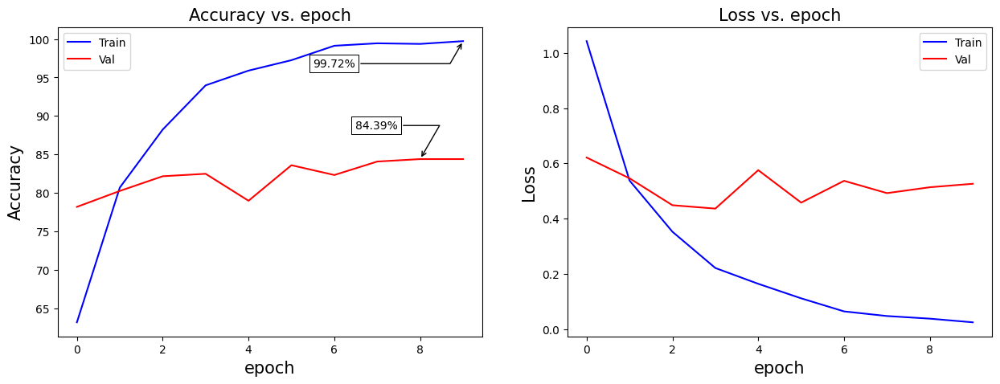

In [ ]:
plot_accuracy_loss(model_v0_fit)

In [ ]:
def print_accuracy_stats(model, ckpt_PATH, ds, class_names):
    model.load_weights(ckpt_PATH)
    true_onehot = tf.concat([y for x, y in ds], axis=0)
    true_categories = tf.argmax(true_onehot, axis=1)
    y_pred = model.predict(ds)
    predicted_categories = tf.argmax(y_pred, axis=1)

    test_acc = metrics.accuracy_score(true_categories, predicted_categories) * 100
    print(f'\nTest Accuracy: {test_acc:.2f}%\n')

# Note: This doesn't work with shuffled datasets
def plot_confusion_matrix(model, ckpt_PATH, ds, class_names):
    model.load_weights(ckpt_PATH)
    true_onehot = tf.concat([y for x, y in ds], axis=0)
    true_categories = tf.argmax(true_onehot, axis=1)
    y_pred = model.predict(ds)
    predicted_categories = tf.argmax(y_pred, axis=1)
    cm = metrics.confusion_matrix(true_categories,predicted_categories) # last batch
    sns.heatmap(cm, annot=True, xticklabels=class_names, yticklabels=class_names, cmap="YlGnBu", fmt='g')
    plt.show()

11/11 [==============================] - 1s 103ms/step

Test Accuracy: 76.64%

11/11 [==============================] - 1s 95ms/step


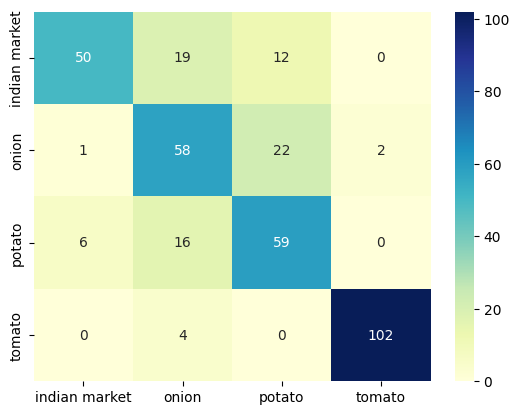

In [ ]:
print_accuracy_stats(model_v0, ckpt_path, test_ds, class_names)
plot_confusion_matrix(model_v0, ckpt_path, test_ds, class_names)

### **Improving Baseline CNN to reduce overfitting**

#### Modification 01 : Reduce over parameterization by adding more Conv blocks and replace flatten layer with GlobalAvgPooling2D

In [ ]:
%reload_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_v1_ckpt/"
log_path = '/content/ninjacart_data/logs/model_v1_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
hidden_size = 256

model_v1 = keras.Sequential(
    name="model_cnn_baseline_mod1",
    layers=[
        layers.Conv2D(filters=16, kernel_size=3, padding="same", activation='relu', input_shape=(ip_height, ip_width, 3)),
        layers.MaxPooling2D(),
        layers.Conv2D(filters=32, kernel_size=3, padding="same", activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(filters=64, kernel_size=3, padding="same", activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(filters=128, kernel_size=3, padding="same", activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(filters=256, kernel_size=3, padding="same", activation='relu'),
        layers.GlobalAveragePooling2D(),
        layers.Dense(units=hidden_size, activation='relu'),
        layers.Dense(units=num_classes, activation='softmax')
    ]
)

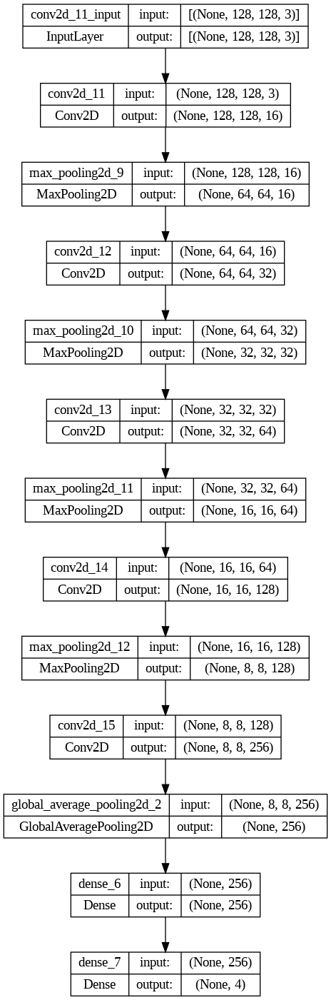

In [ ]:
tf.keras.utils.plot_model(model_v1, show_shapes=True)

In [ ]:
model_v1.summary()

Model: "model_cnn_baseline_mod1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_11 (Conv2D)          (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 64, 64, 16)       0         
 2D)                                                             
                                                                 
 conv2d_12 (Conv2D)          (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 32, 32, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 32, 32, 64)        18496     
                                                                 
 max_pooling2d_11 (MaxPoolin  (None, 16, 16

In [ ]:
model_v1.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 30
model_v1_fit = model_v1.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=base_callbacks)

Epoch 1/30
79/79 [==============================] - 14s 137ms/step - loss: 0.9676 - accuracy: 0.5529 - top_3_accuracy: 0.9426 - val_loss: 0.9436 - val_accuracy: 0.6162 - val_top_3_accuracy: 0.9761
Epoch 2/30
79/79 [==============================] - 11s 128ms/step - loss: 0.7109 - accuracy: 0.7100 - top_3_accuracy: 0.9805 - val_loss: 0.5592 - val_accuracy: 0.7739 - val_top_3_accuracy: 0.9873
Epoch 3/30
79/79 [==============================] - 13s 157ms/step - loss: 0.5612 - accuracy: 0.7822 - top_3_accuracy: 0.9864 - val_loss: 0.5390 - val_accuracy: 0.7723 - val_top_3_accuracy: 0.9857
Epoch 4/30
79/79 [==============================] - 11s 129ms/step - loss: 0.5213 - accuracy: 0.7998 - top_3_accuracy: 0.9908 - val_loss: 0.5877 - val_accuracy: 0.7739 - val_top_3_accuracy: 0.9841
Epoch 5/30
79/79 [==============================] - 11s 129ms/step - loss: 0.4753 - accuracy: 0.8125 - top_3_accuracy: 0.9940 - val_loss: 0.3979 - val_accuracy: 0.8424 - val_top_3_accuracy: 0.9968
Epoch 6/30
79/7

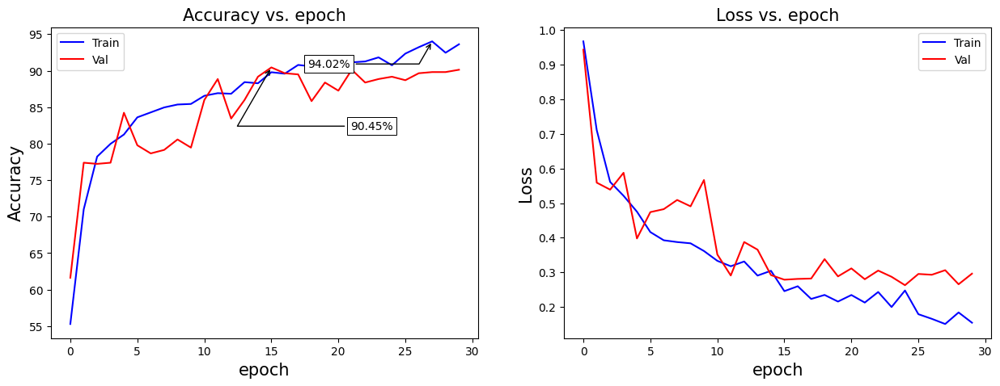

In [ ]:
plot_accuracy_loss(model_v1_fit)

11/11 [==============================] - 1s 118ms/step

Test Accuracy: 88.32%

11/11 [==============================] - 1s 95ms/step


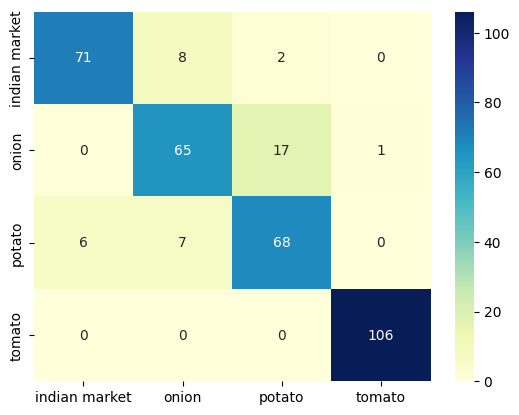

In [ ]:
print_accuracy_stats(model_v1, ckpt_path, test_ds, class_names)
plot_confusion_matrix(model_v1, ckpt_path, test_ds, class_names)

#### Modification 02 : Batch Normalization and Dropout

In [ ]:
%reload_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_v2_ckpt/"
log_path = '/content/ninjacart_data/logs/model_v2_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
hidden_size = 256

model_v2 = keras.Sequential(
        name="model_cnn_baseline_mod2",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", input_shape=(ip_height, ip_width, 3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=32, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=64, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=128, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=256, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.GlobalAveragePooling2D(),
            layers.Dense(units=hidden_size),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.Dropout(0.2),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )

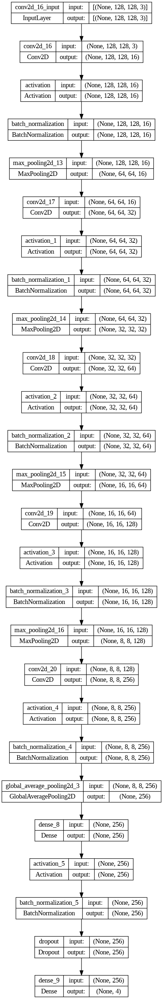

In [ ]:
tf.keras.utils.plot_model(model_v2, show_shapes=True)

In [ ]:
model_v2.summary()

Model: "model_cnn_baseline_mod2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_16 (Conv2D)          (None, 128, 128, 16)      448       
                                                                 
 activation (Activation)     (None, 128, 128, 16)      0         
                                                                 
 batch_normalization (BatchN  (None, 128, 128, 16)     64        
 ormalization)                                                   
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 64, 64, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_17 (Conv2D)          (None, 64, 64, 32)        4640      
                                                                 
 activation_1 (Activation)   (None, 64, 64,

In [ ]:
model_v2.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 30
model_v2_fit = model_v2.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=base_callbacks)

Epoch 1/30
79/79 [==============================] - 19s 161ms/step - loss: 0.7703 - accuracy: 0.7156 - top_3_accuracy: 0.9721 - val_loss: 1.2507 - val_accuracy: 0.4045 - val_top_3_accuracy: 0.8360
Epoch 2/30
79/79 [==============================] - 11s 130ms/step - loss: 0.5736 - accuracy: 0.7890 - top_3_accuracy: 0.9884 - val_loss: 1.7672 - val_accuracy: 0.3981 - val_top_3_accuracy: 0.8551
Epoch 3/30
79/79 [==============================] - 11s 128ms/step - loss: 0.4660 - accuracy: 0.8189 - top_3_accuracy: 0.9940 - val_loss: 1.6730 - val_accuracy: 0.4570 - val_top_3_accuracy: 0.8487
Epoch 4/30
79/79 [==============================] - 11s 129ms/step - loss: 0.4340 - accuracy: 0.8353 - top_3_accuracy: 0.9956 - val_loss: 1.8648 - val_accuracy: 0.4220 - val_top_3_accuracy: 0.9092
Epoch 5/30
79/79 [==============================] - 12s 142ms/step - loss: 0.3897 - accuracy: 0.8544 - top_3_accuracy: 0.9960 - val_loss: 1.5080 - val_accuracy: 0.5701 - val_top_3_accuracy: 0.9761
Epoch 6/30
79/7

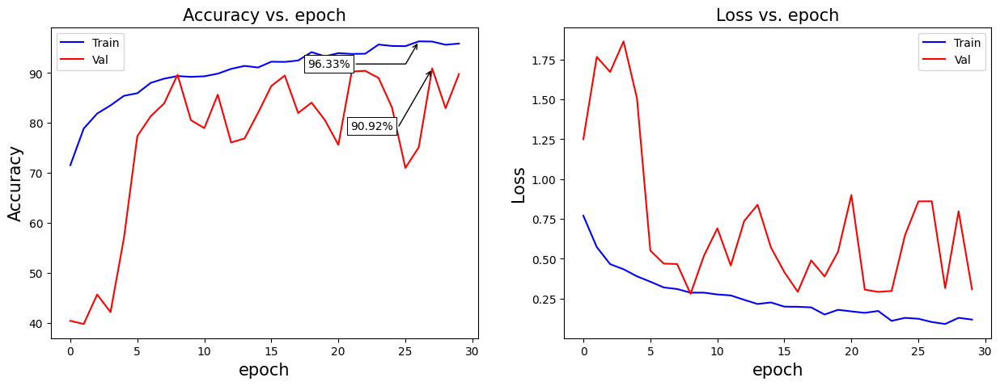

In [ ]:
plot_accuracy_loss(model_v2_fit)

11/11 [==============================] - 1s 96ms/step

Test Accuracy: 89.46%

11/11 [==============================] - 1s 100ms/step


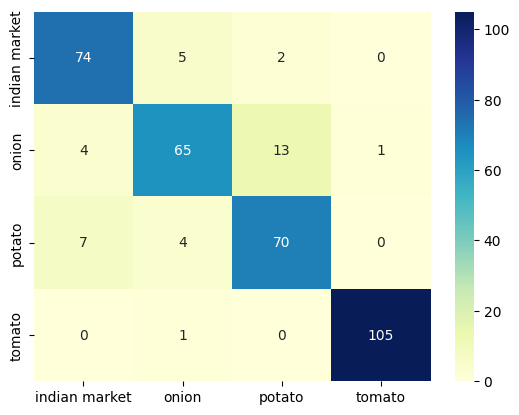

In [ ]:
print_accuracy_stats(model_v2, ckpt_path, test_ds, class_names)
plot_confusion_matrix(model_v2, ckpt_path, test_ds, class_names)

#### Modification 03: Implementing Callbacks while training the model

In [ ]:
%reload_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_v3_ckpt/"
log_path = '/content/ninjacart_data/logs/model_v3_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
EarlyStop = [keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, min_delta=0.001, mode='min')]

In [ ]:
hidden_size = 256

model_v3 = keras.Sequential(
        name="model_cnn_baseline_mod3",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", input_shape=(ip_height, ip_width, 3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=32, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=64, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=128, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=256, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.GlobalAveragePooling2D(),
            layers.Dense(units=hidden_size),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.Dropout(0.2),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )

In [ ]:
model_v3.summary()

Model: "model_cnn_baseline_mod3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_21 (Conv2D)          (None, 128, 128, 16)      448       
                                                                 
 activation_6 (Activation)   (None, 128, 128, 16)      0         
                                                                 
 batch_normalization_6 (Batc  (None, 128, 128, 16)     64        
 hNormalization)                                                 
                                                                 
 max_pooling2d_17 (MaxPoolin  (None, 64, 64, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_22 (Conv2D)          (None, 64, 64, 32)        4640      
                                                                 
 activation_7 (Activation)   (None, 64, 64,

In [ ]:
model_v3.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 100
model_v3_fit = model_v3.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=[base_callbacks, EarlyStop])

Epoch 1/100
79/79 [==============================] - 20s 179ms/step - loss: 0.6890 - accuracy: 0.7407 - top_3_accuracy: 0.9797 - val_loss: 1.4763 - val_accuracy: 0.2866 - val_top_3_accuracy: 0.8089
Epoch 2/100
79/79 [==============================] - 12s 142ms/step - loss: 0.5348 - accuracy: 0.7946 - top_3_accuracy: 0.9868 - val_loss: 3.0342 - val_accuracy: 0.2866 - val_top_3_accuracy: 0.8089
Epoch 3/100
79/79 [==============================] - 13s 150ms/step - loss: 0.4566 - accuracy: 0.8281 - top_3_accuracy: 0.9932 - val_loss: 2.1436 - val_accuracy: 0.3328 - val_top_3_accuracy: 0.8312
Epoch 4/100
79/79 [==============================] - 12s 135ms/step - loss: 0.4116 - accuracy: 0.8400 - top_3_accuracy: 0.9956 - val_loss: 1.2997 - val_accuracy: 0.5621 - val_top_3_accuracy: 0.8567
Epoch 5/100
79/79 [==============================] - 13s 160ms/step - loss: 0.4007 - accuracy: 0.8492 - top_3_accuracy: 0.9956 - val_loss: 1.1561 - val_accuracy: 0.5812 - val_top_3_accuracy: 0.9777
Epoch 6/10

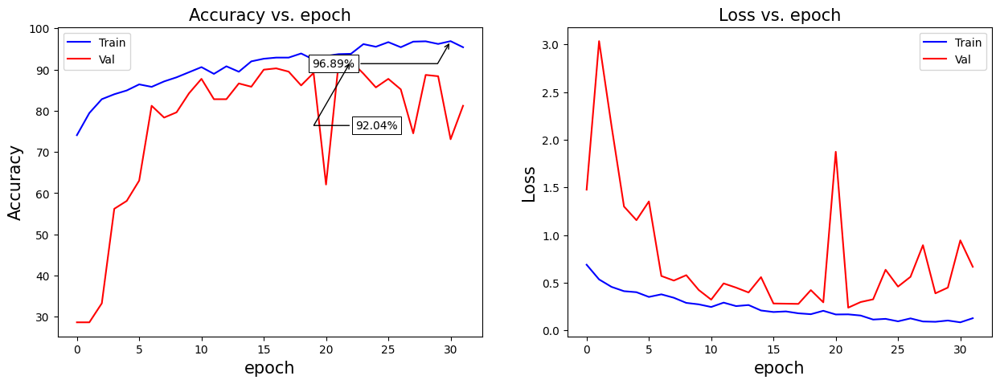

In [ ]:
plot_accuracy_loss(model_v3_fit)

11/11 [==============================] - 1s 96ms/step

Test Accuracy: 84.05%

11/11 [==============================] - 1s 95ms/step


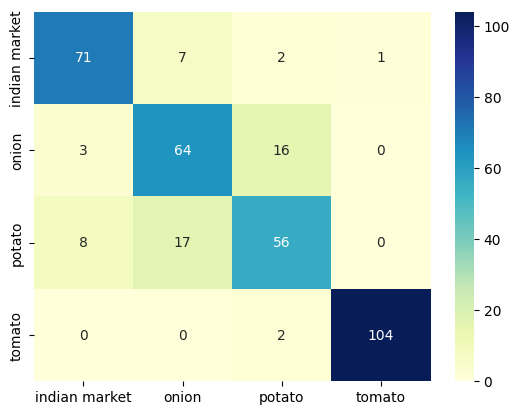

In [ ]:
print_accuracy_stats(model_v3, ckpt_path, test_ds, class_names)
plot_confusion_matrix(model_v3, ckpt_path, test_ds, class_names)

#### Modification 04: Add regularization

In [ ]:
%reload_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_v4_ckpt/"
log_path = '/content/ninjacart_data/logs/model_v4_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
EarlyStop = [keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, min_delta=0.001, mode='min')]

In [ ]:
hidden_size = 256

model_v4 = keras.Sequential(
        name="model_cnn_baseline_mod4",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", input_shape=(ip_height, ip_width, 3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=32, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=64, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=128, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=256, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.GlobalAveragePooling2D(),
            layers.Dense(units=hidden_size, kernel_regularizer=regularizers.L2(1e-3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.Dropout(0.2),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )

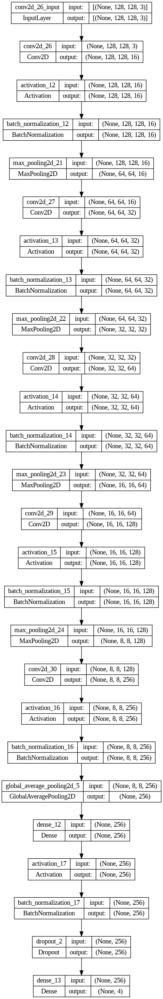

In [ ]:
tf.keras.utils.plot_model(model_v4, show_shapes=True)

In [ ]:
model_v4.summary()

Model: "model_cnn_baseline_mod4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_26 (Conv2D)          (None, 128, 128, 16)      448       
                                                                 
 activation_12 (Activation)  (None, 128, 128, 16)      0         
                                                                 
 batch_normalization_12 (Bat  (None, 128, 128, 16)     64        
 chNormalization)                                                
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 64, 64, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_27 (Conv2D)          (None, 64, 64, 32)        4640      
                                                                 
 activation_13 (Activation)  (None, 64, 64,

In [ ]:
model_v4.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 100
model_v4_fit = model_v4.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=[base_callbacks, EarlyStop])

Epoch 1/100
79/79 [==============================] - 16s 121ms/step - loss: 0.9910 - accuracy: 0.7288 - top_3_accuracy: 0.9705 - val_loss: 1.9470 - val_accuracy: 0.2882 - val_top_3_accuracy: 0.9061
Epoch 2/100
79/79 [==============================] - 12s 143ms/step - loss: 0.7781 - accuracy: 0.7950 - top_3_accuracy: 0.9916 - val_loss: 2.8083 - val_accuracy: 0.4777 - val_top_3_accuracy: 0.8025
Epoch 3/100
79/79 [==============================] - 12s 143ms/step - loss: 0.6942 - accuracy: 0.8193 - top_3_accuracy: 0.9940 - val_loss: 1.7216 - val_accuracy: 0.5366 - val_top_3_accuracy: 0.8153
Epoch 4/100
79/79 [==============================] - 11s 130ms/step - loss: 0.6364 - accuracy: 0.8488 - top_3_accuracy: 0.9940 - val_loss: 2.0172 - val_accuracy: 0.4936 - val_top_3_accuracy: 0.8137
Epoch 5/100
79/79 [==============================] - 12s 144ms/step - loss: 0.5639 - accuracy: 0.8616 - top_3_accuracy: 0.9964 - val_loss: 1.8058 - val_accuracy: 0.5621 - val_top_3_accuracy: 0.8137
Epoch 6/10

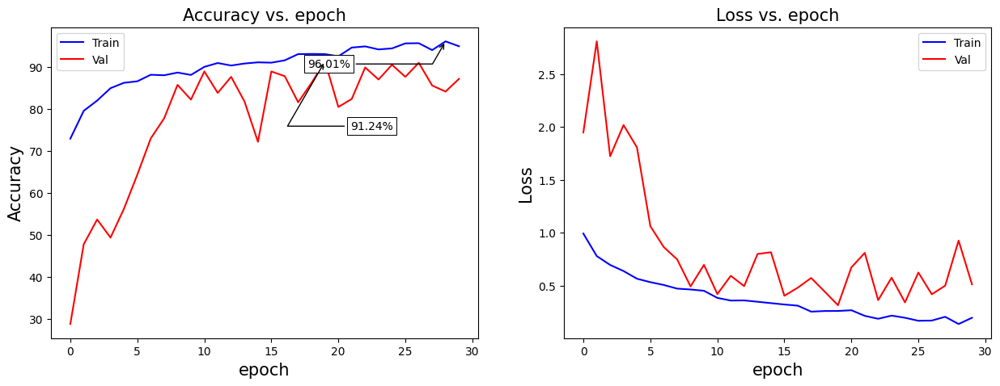

In [ ]:
plot_accuracy_loss(model_v4_fit)

11/11 [==============================] - 2s 185ms/step

Test Accuracy: 85.75%

11/11 [==============================] - 1s 98ms/step


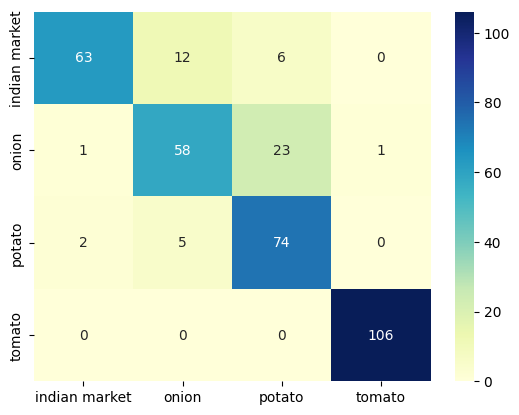

In [ ]:
print_accuracy_stats(model_v4, ckpt_path, test_ds, class_names)
plot_confusion_matrix(model_v4, ckpt_path, test_ds, class_names)

#### Modification 05: Data Augmentation

In [ ]:
# Functions to Load and Visualize Samples
# Load Sample
def load_sample(output_size=(300, 300)):
    sample = keras.preprocessing.image.load_img(
        "/content/ninjacart_data/data_train/onion/1GT4PBJL88PV.jpg",
    )
    #sample = keras.utils.load_img(sample, target_size=output_size)
    sample = keras.utils.img_to_array(sample)
    return sample

# Visualize Sample
def show_images(imgs, num_rows, num_cols, scale=2):
    # show augmented images in a grid layout
    aspect_ratio = imgs[0].shape[0]/imgs[0].shape[1]
    figsize = (num_cols * scale, num_rows * scale * aspect_ratio)
    _, axes = plt.subplots(num_rows, num_cols, figsize=figsize)
    for i in range(num_rows):
        for j in range(num_cols):
            if num_rows != 1:
                axes[i][j].imshow(imgs[i * num_cols + j].numpy().astype("uint8"))
                axes[i][j].axes.get_xaxis().set_visible(False)
                axes[i][j].axes.get_yaxis().set_visible(False)
            else:
                plt.imsave('test.png', imgs[i * num_cols + j].numpy()[0].astype("uint8"))
                # print(imgs[i * num_cols + j].numpy()[0].astype("uint8"))
                axes[j].imshow(imgs[i * num_cols + j].numpy().astype("uint8"))
                axes[j].axes.get_xaxis().set_visible(False)
                axes[j].axes.get_yaxis().set_visible(False)
    plt.subplots_adjust(hspace=0.1, wspace=0)
    return axes

def apply(img, aug, num_rows=1, num_cols=4, scale=3):
    # apply augmentation multiple times to obtain different samples
    Y = [aug(img) for _ in range(num_rows * num_cols)]
    show_images(Y, num_rows, num_cols, scale)

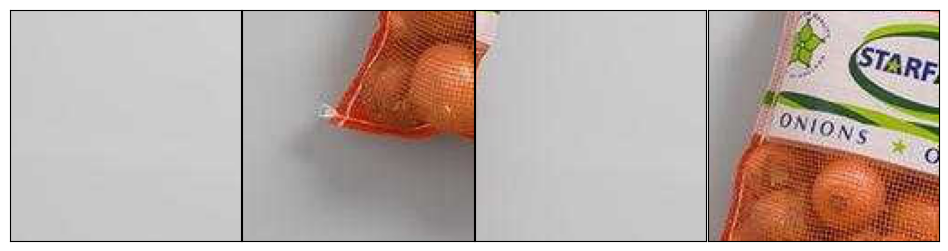

In [ ]:
sample = load_sample(output_size=(300, 300))
aug_layer = layers.RandomCrop(height = 128, width = 128)

apply(sample, aug_layer)

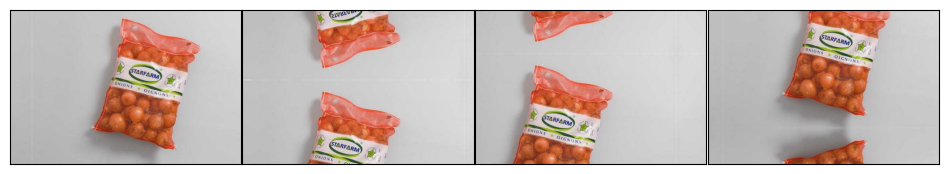

In [ ]:
sample = load_sample(output_size=(128, 128))
aug_layer = layers.RandomTranslation(height_factor = (-0.3, 0.5), width_factor = (-0.3, 0.2))

apply(sample, aug_layer)

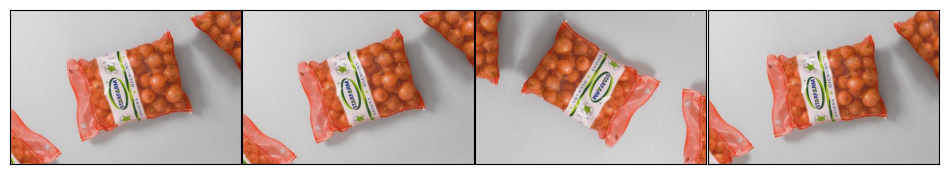

In [ ]:
sample = load_sample(output_size=(128, 128))
aug_layer = layers.RandomRotation(factor = (-0.4, 0.5))

apply(sample, aug_layer)

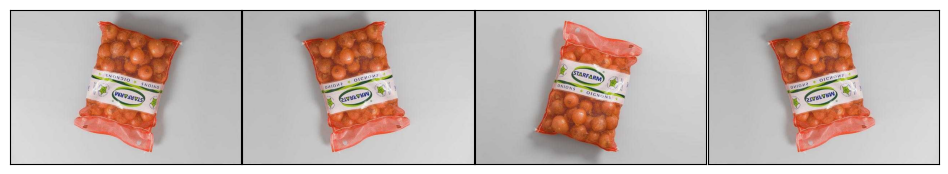

In [ ]:
sample = load_sample(output_size=(128, 128))
aug_layer = layers.RandomFlip(mode='horizontal_and_vertical')

apply(sample, aug_layer)

In [ ]:
def preprocess_v2(train_data, val_data, test_data, target_height=128, target_width=128):

    # Data Processing Stage with resizing and rescaling operations #same as before for test,val
    data_preprocess = keras.Sequential(
        name="data_preprocess",
        layers=[
            layers.Resizing(target_height, target_width),
            layers.Rescaling(1.0/255),
        ]
    )

    # Data Processing Stage with resizing and rescaling operations
    data_augmentation = keras.Sequential(
        name="data_augmentation",
        layers=[
            layers.Resizing(target_height, target_width),
            #layers.RandomCrop(height = 128, width = 128),
            layers.RandomTranslation(height_factor = (-0.3, 0.5), width_factor = (-0.3, 0.2)),
            layers.RandomRotation(factor = (-0.4, 0.5)),
            layers.RandomFlip(mode='horizontal_and_vertical'),
            layers.Rescaling(1.0/255),
        ]
    )

    # Perform Data Processing on the train, val, test dataset
    train_ds_aug = train_data.map(
        lambda x, y: (data_augmentation(x), y), num_parallel_calls=tf.data.AUTOTUNE
    ).prefetch(tf.data.AUTOTUNE)
    val_ds_aug = val_data.map(
        lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE
    ).prefetch(tf.data.AUTOTUNE)
    test_ds_aug = test_data.map(
        lambda x, y: (data_preprocess(x), y), num_parallel_calls=tf.data.AUTOTUNE
    ).prefetch(tf.data.AUTOTUNE)

    return train_ds, val_ds, test_ds

In [ ]:
train_ds_aug, val_ds_aug, test_ds_aug = preprocess_v2(train_data, val_data, test_data)

In [ ]:
%reload_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_v5_ckpt/"
log_path = '/content/ninjacart_data/logs/model_v5_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
EarlyStop = [keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, min_delta=0.001, mode='min')]

In [ ]:
hidden_size = 256

model_v5 = keras.Sequential(
        name="model_cnn_baseline_mod5",
        layers=[
            layers.Conv2D(filters=16, kernel_size=3, padding="same", input_shape=(ip_height, ip_width, 3)),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=32, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=64, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=128, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.MaxPooling2D(),
            layers.Conv2D(filters=256, kernel_size=3, padding="same"),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.GlobalAveragePooling2D(),
            layers.Dense(units=hidden_size),
            layers.Activation("relu"),
            layers.BatchNormalization(),
            layers.Dropout(0.2),
            layers.Dense(units=num_classes, activation='softmax')
        ]
    )

In [ ]:
model_v5.summary()

Model: "model_cnn_baseline_mod5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_31 (Conv2D)          (None, 128, 128, 16)      448       
                                                                 
 activation_18 (Activation)  (None, 128, 128, 16)      0         
                                                                 
 batch_normalization_18 (Bat  (None, 128, 128, 16)     64        
 chNormalization)                                                
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 64, 64, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_32 (Conv2D)          (None, 64, 64, 32)        4640      
                                                                 
 activation_19 (Activation)  (None, 64, 64,

In [ ]:
model_v5.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 100
model_v5_fit = model_v5.fit(train_ds_aug, validation_data=val_ds_aug, epochs=epochs, callbacks=[base_callbacks, EarlyStop])

Epoch 1/100
79/79 [==============================] - 19s 172ms/step - loss: 0.7381 - accuracy: 0.7471 - top_3_accuracy: 0.9717 - val_loss: 1.3761 - val_accuracy: 0.4331 - val_top_3_accuracy: 0.8089
Epoch 2/100
79/79 [==============================] - 11s 129ms/step - loss: 0.5378 - accuracy: 0.7978 - top_3_accuracy: 0.9920 - val_loss: 1.7324 - val_accuracy: 0.2866 - val_top_3_accuracy: 0.8089
Epoch 3/100
79/79 [==============================] - 12s 140ms/step - loss: 0.4583 - accuracy: 0.8273 - top_3_accuracy: 0.9932 - val_loss: 1.7973 - val_accuracy: 0.3646 - val_top_3_accuracy: 0.8089
Epoch 4/100
79/79 [==============================] - 12s 143ms/step - loss: 0.3901 - accuracy: 0.8484 - top_3_accuracy: 0.9948 - val_loss: 2.7494 - val_accuracy: 0.4459 - val_top_3_accuracy: 0.9156
Epoch 5/100
79/79 [==============================] - 11s 129ms/step - loss: 0.4019 - accuracy: 0.8404 - top_3_accuracy: 0.9972 - val_loss: 1.2922 - val_accuracy: 0.6306 - val_top_3_accuracy: 0.8408
Epoch 6/10

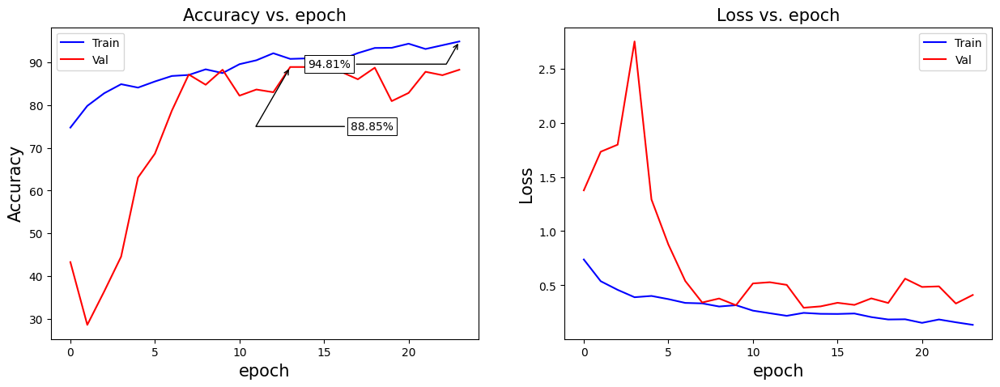

In [ ]:
plot_accuracy_loss(model_v5_fit)

11/11 [==============================] - 1s 99ms/step

Test Accuracy: 90.60%

11/11 [==============================] - 1s 99ms/step


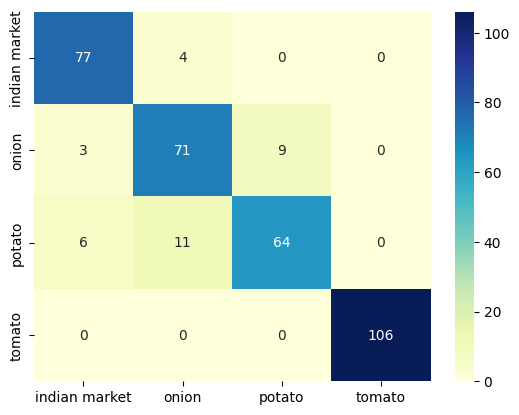

In [ ]:
print_accuracy_stats(model_v5, ckpt_path, test_ds_aug, class_names)
plot_confusion_matrix(model_v5, ckpt_path, test_ds_aug, class_names)

### **Finetune pretrained models**

#### VGG16 pretrained model

In [ ]:
%reload_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_VGG16_ckpt/"
log_path = '/content/ninjacart_data/logs/model_VGG16_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
EarlyStop = [keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, min_delta=0.001, mode='min')]

In [ ]:
hidden_size = 256

pretrained_model_VGG16 = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=[ip_height, ip_width, 3])
pretrained_model_VGG16.trainable=False
vgg16_model = tf.keras.Sequential([
    pretrained_model_VGG16,
    layers.GlobalAveragePooling2D(),
    layers.Dense(units=hidden_size, activation='relu'),
    layers.Dense(units=num_classes, activation='softmax')
])

58889256/58889256 [==============================] - 0s 0us/step


In [ ]:
vgg16_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 4, 4, 512)         14714688  
                                                                 
 global_average_pooling2d_7   (None, 512)              0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_16 (Dense)            (None, 256)               131328    
                                                                 
 dense_17 (Dense)            (None, 4)                 1028      
                                                                 
Total params: 14,847,044
Trainable params: 132,356
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
vgg16_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 100
vgg16_model_fit = vgg16_model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=[base_callbacks, EarlyStop])

Epoch 1/100
79/79 [==============================] - 21s 199ms/step - loss: 0.6587 - accuracy: 0.7399 - top_3_accuracy: 0.9832 - val_loss: 0.4246 - val_accuracy: 0.8344 - val_top_3_accuracy: 0.9968
Epoch 2/100
79/79 [==============================] - 14s 171ms/step - loss: 0.3630 - accuracy: 0.8600 - top_3_accuracy: 0.9936 - val_loss: 0.3418 - val_accuracy: 0.8694 - val_top_3_accuracy: 0.9968
Epoch 3/100
79/79 [==============================] - 14s 168ms/step - loss: 0.2957 - accuracy: 0.8871 - top_3_accuracy: 0.9948 - val_loss: 0.2947 - val_accuracy: 0.8949 - val_top_3_accuracy: 0.9952
Epoch 4/100
79/79 [==============================] - 14s 169ms/step - loss: 0.2558 - accuracy: 0.9019 - top_3_accuracy: 0.9976 - val_loss: 0.3037 - val_accuracy: 0.8822 - val_top_3_accuracy: 1.0000
Epoch 5/100
79/79 [==============================] - 15s 178ms/step - loss: 0.2339 - accuracy: 0.9079 - top_3_accuracy: 0.9992 - val_loss: 0.3193 - val_accuracy: 0.8742 - val_top_3_accuracy: 0.9984
Epoch 6/10

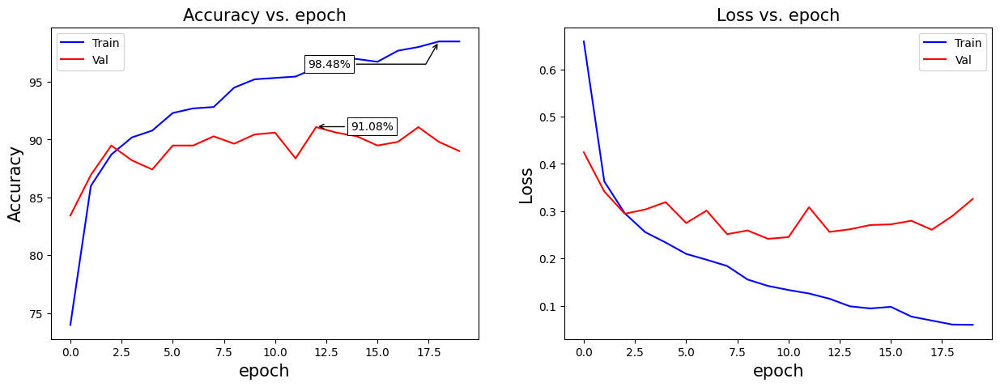

In [ ]:
plot_accuracy_loss(vgg16_model_fit)

11/11 [==============================] - 3s 303ms/step

Test Accuracy: 86.89%

11/11 [==============================] - 1s 118ms/step


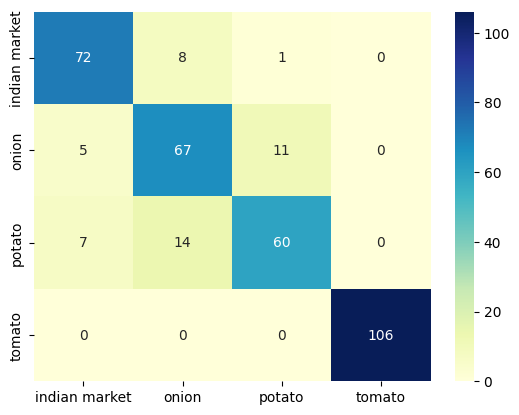

In [ ]:
print_accuracy_stats(vgg16_model, ckpt_path, test_ds, class_names)
plot_confusion_matrix(vgg16_model, ckpt_path, test_ds, class_names)

#### ResNet-50 pretrained model

In [ ]:
%reload_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_ResNet50_ckpt/"
log_path = '/content/ninjacart_data/logs/model_ResNet50_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
EarlyStop = [keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, min_delta=0.001, mode='min')]

In [ ]:
hidden_size = 256

pretrained_model_ResNet50 = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=[ip_height, ip_width, 3])
pretrained_model_ResNet50.trainable=False
ResNet50_model = tf.keras.Sequential([
    pretrained_model_ResNet50,
    layers.GlobalAveragePooling2D(),
    layers.Dense(units=hidden_size, activation='relu'),
    layers.Dense(units=num_classes, activation='softmax')
])

94765736/94765736 [==============================] - 0s 0us/step


In [ ]:
ResNet50_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d_8   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_18 (Dense)            (None, 256)               524544    
                                                                 
 dense_19 (Dense)            (None, 4)                 1028      
                                                                 
Total params: 24,113,284
Trainable params: 525,572
Non-trainable params: 23,587,712
_________________________________________________________________


In [ ]:
ResNet50_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 100
ResNet50_model_fit = ResNet50_model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=[base_callbacks, EarlyStop])

Epoch 1/100
79/79 [==============================] - 24s 236ms/step - loss: 1.3275 - accuracy: 0.3466 - top_3_accuracy: 0.8532 - val_loss: 1.2568 - val_accuracy: 0.4713 - val_top_3_accuracy: 0.9124
Epoch 2/100
79/79 [==============================] - 17s 206ms/step - loss: 1.2165 - accuracy: 0.4527 - top_3_accuracy: 0.9114 - val_loss: 1.1820 - val_accuracy: 0.4363 - val_top_3_accuracy: 0.9522
Epoch 3/100
79/79 [==============================] - 17s 207ms/step - loss: 1.1496 - accuracy: 0.4938 - top_3_accuracy: 0.9378 - val_loss: 1.1139 - val_accuracy: 0.5398 - val_top_3_accuracy: 0.9506
Epoch 4/100
79/79 [==============================] - 18s 218ms/step - loss: 1.0851 - accuracy: 0.5389 - top_3_accuracy: 0.9529 - val_loss: 1.0758 - val_accuracy: 0.5175 - val_top_3_accuracy: 0.9554
Epoch 5/100
79/79 [==============================] - 18s 214ms/step - loss: 1.0556 - accuracy: 0.5353 - top_3_accuracy: 0.9541 - val_loss: 1.1420 - val_accuracy: 0.4968 - val_top_3_accuracy: 0.9379
Epoch 6/10

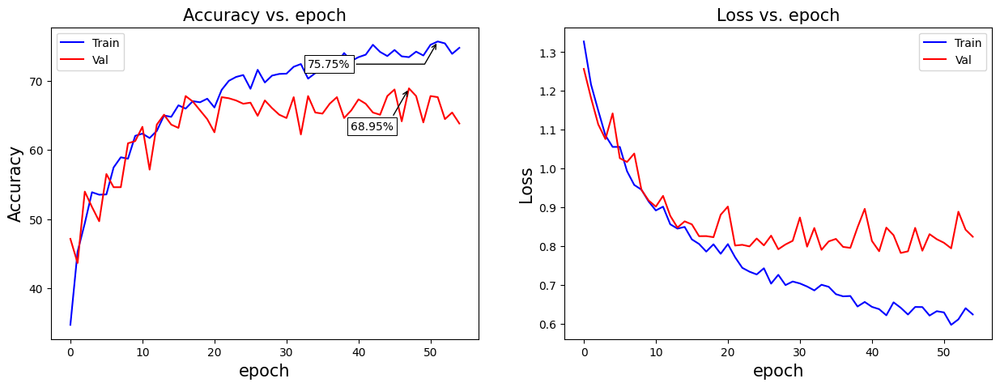

In [ ]:
plot_accuracy_loss(ResNet50_model_fit)

11/11 [==============================] - 3s 179ms/step

Test Accuracy: 59.54%

11/11 [==============================] - 1s 110ms/step


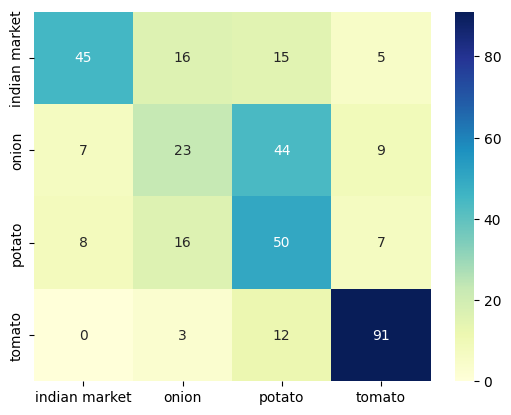

In [ ]:
print_accuracy_stats(ResNet50_model, ckpt_path, test_ds, class_names)
plot_confusion_matrix(ResNet50_model, ckpt_path, test_ds, class_names)

#### InceptionV3 pretrained model

In [ ]:
%reload_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_InceptionV3_ckpt/"
log_path = '/content/ninjacart_data/logs/model_InceptionV3_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
EarlyStop = [keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, min_delta=0.001, mode='min')]

In [ ]:
hidden_size = 256

pretrained_model_InceptionV3 = tf.keras.applications.InceptionV3(weights='imagenet', include_top=False, input_shape=[ip_height, ip_width, 3])
pretrained_model_InceptionV3.trainable=False
InceptionV3_model = tf.keras.Sequential([
    pretrained_model_InceptionV3,
    layers.GlobalAveragePooling2D(),
    layers.Dense(units=hidden_size, activation='relu'),
    layers.Dense(units=num_classes, activation='softmax')
])

87910968/87910968 [==============================] - 0s 0us/step


In [ ]:
InceptionV3_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2, 2, 2048)        21802784  
                                                                 
 global_average_pooling2d_9   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_20 (Dense)            (None, 256)               524544    
                                                                 
 dense_21 (Dense)            (None, 4)                 1028      
                                                                 
Total params: 22,328,356
Trainable params: 525,572
Non-trainable params: 21,802,784
_________________________________________________________________


In [ ]:
InceptionV3_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 100
InceptionV3_model_fit = InceptionV3_model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=[base_callbacks, EarlyStop])

Epoch 1/100
79/79 [==============================] - 26s 256ms/step - loss: 0.6319 - accuracy: 0.8097 - top_3_accuracy: 0.9828 - val_loss: 0.3171 - val_accuracy: 0.8806 - val_top_3_accuracy: 0.9920
Epoch 2/100
79/79 [==============================] - 18s 216ms/step - loss: 0.1853 - accuracy: 0.9338 - top_3_accuracy: 0.9996 - val_loss: 0.2551 - val_accuracy: 0.9124 - val_top_3_accuracy: 0.9984
Epoch 3/100
79/79 [==============================] - 18s 215ms/step - loss: 0.1290 - accuracy: 0.9493 - top_3_accuracy: 1.0000 - val_loss: 0.2740 - val_accuracy: 0.9045 - val_top_3_accuracy: 0.9968
Epoch 4/100
79/79 [==============================] - 20s 242ms/step - loss: 0.0760 - accuracy: 0.9733 - top_3_accuracy: 1.0000 - val_loss: 0.2922 - val_accuracy: 0.9156 - val_top_3_accuracy: 0.9952
Epoch 5/100
79/79 [==============================] - 18s 215ms/step - loss: 0.0473 - accuracy: 0.9864 - top_3_accuracy: 1.0000 - val_loss: 0.3408 - val_accuracy: 0.9045 - val_top_3_accuracy: 0.9952
Epoch 6/10

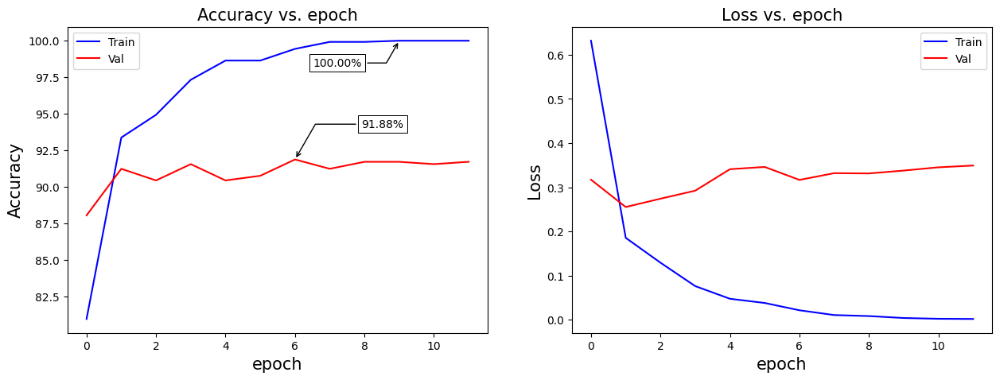

In [ ]:
plot_accuracy_loss(InceptionV3_model_fit)

11/11 [==============================] - 4s 223ms/step

Test Accuracy: 87.18%

11/11 [==============================] - 1s 115ms/step


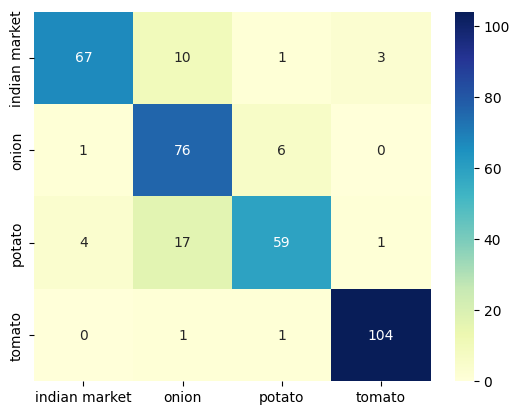

In [ ]:
print_accuracy_stats(InceptionV3_model, ckpt_path, test_ds, class_names)
plot_confusion_matrix(InceptionV3_model, ckpt_path, test_ds, class_names)

#### EfficientNetB7 pretrained model

In [ ]:
%reload_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_EfficientNetB7_ckpt/"
log_path = '/content/ninjacart_data/logs/model_EfficientNetB7_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
EarlyStop = [keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, min_delta=0.001, mode='min')]

In [ ]:
hidden_size = 256

pretrained_model_EfficientNetB7 = tf.keras.applications.EfficientNetB7(weights='imagenet', include_top=False, input_shape=[ip_height, ip_width, 3])
pretrained_model_EfficientNetB7.trainable=False
EfficientNetB7_model = tf.keras.Sequential([
    pretrained_model_EfficientNetB7,
    layers.GlobalAveragePooling2D(),
    layers.Dense(units=hidden_size, activation='relu'),
    layers.Dense(units=num_classes, activation='softmax')
])

258076736/258076736 [==============================] - 7s 0us/step


In [ ]:
EfficientNetB7_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetb7 (Functional)  (None, 4, 4, 2560)       64097687  
                                                                 
 global_average_pooling2d_10  (None, 2560)             0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_22 (Dense)            (None, 256)               655616    
                                                                 
 dense_23 (Dense)            (None, 4)                 1028      
                                                                 
Total params: 64,754,331
Trainable params: 656,644
Non-trainable params: 64,097,687
_________________________________________________________________


In [ ]:
EfficientNetB7_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 100
EfficientNetB7_model_fit = EfficientNetB7_model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=[base_callbacks, EarlyStop])

Epoch 1/100
79/79 [==============================] - 68s 538ms/step - loss: 1.6896 - accuracy: 0.2708 - top_3_accuracy: 0.7762 - val_loss: 1.5368 - val_accuracy: 0.1911 - val_top_3_accuracy: 0.7134
Epoch 2/100
79/79 [==============================] - 35s 437ms/step - loss: 1.4430 - accuracy: 0.2537 - top_3_accuracy: 0.7710 - val_loss: 1.3770 - val_accuracy: 0.2866 - val_top_3_accuracy: 0.8089
Epoch 3/100
79/79 [==============================] - 33s 417ms/step - loss: 1.4075 - accuracy: 0.2888 - top_3_accuracy: 0.7930 - val_loss: 1.3798 - val_accuracy: 0.2866 - val_top_3_accuracy: 0.9140
Epoch 4/100
79/79 [==============================] - 34s 421ms/step - loss: 1.4018 - accuracy: 0.2625 - top_3_accuracy: 0.7814 - val_loss: 1.4030 - val_accuracy: 0.2516 - val_top_3_accuracy: 0.7293
Epoch 5/100
79/79 [==============================] - 33s 412ms/step - loss: 1.3989 - accuracy: 0.2661 - top_3_accuracy: 0.7818 - val_loss: 1.3809 - val_accuracy: 0.2866 - val_top_3_accuracy: 0.8105
Epoch 6/10

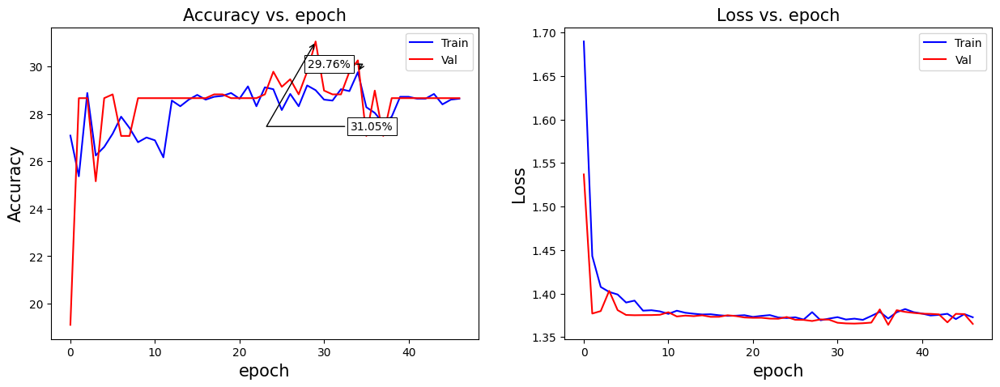

In [ ]:
plot_accuracy_loss(EfficientNetB7_model_fit)

11/11 [==============================] - 8s 234ms/step

Test Accuracy: 23.93%

11/11 [==============================] - 2s 143ms/step


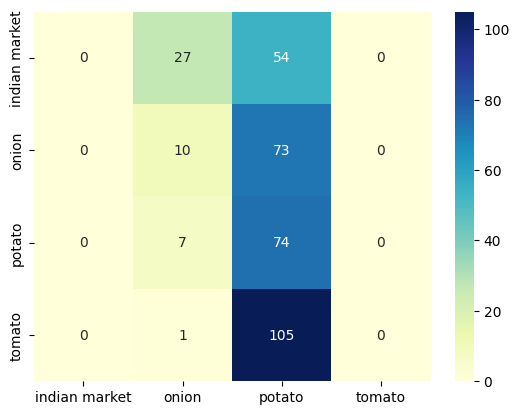

In [ ]:
print_accuracy_stats(EfficientNetB7_model, ckpt_path, test_ds, class_names)
plot_confusion_matrix(EfficientNetB7_model, ckpt_path, test_ds, class_names)

#### MobileNet pretrained model

In [ ]:
%reload_ext tensorboard
ckpt_path = "/content/ninjacart_data/checkpoints/model_MobileNet_ckpt/"
log_path = '/content/ninjacart_data/logs/model_MobileNet_log/'

In [ ]:
base_callbacks = [
        keras.callbacks.ModelCheckpoint(ckpt_path, save_weights_only=True, monitor='val_accuracy', \
                                        mode='max', save_best_only=True),
        keras.callbacks.TensorBoard(log_dir=log_path, histogram_freq=1, write_graph=True, update_freq='epoch')
    ]

In [ ]:
EarlyStop = [keras.callbacks.EarlyStopping(monitor="val_loss", patience=10, min_delta=0.001, mode='min')]

In [ ]:
hidden_size = 256

pretrained_model_MobileNet = tf.keras.applications.MobileNet(weights='imagenet', include_top=False, input_shape=[ip_height, ip_width, 3])
pretrained_model_MobileNet.trainable=False
MobileNet_model = tf.keras.Sequential([
    pretrained_model_MobileNet,
    layers.GlobalAveragePooling2D(),
    layers.Dense(units=hidden_size, activation='relu'),
    layers.Dense(units=num_classes, activation='softmax')
])

17225924/17225924 [==============================] - 0s 0us/step


In [ ]:
MobileNet_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_128 (Functio  (None, 4, 4, 1024)       3228864   
 nal)                                                            
                                                                 
 global_average_pooling2d_11  (None, 1024)             0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_24 (Dense)            (None, 256)               262400    
                                                                 
 dense_25 (Dense)            (None, 4)                 1028      
                                                                 
Total params: 3,492,292
Trainable params: 263,428
Non-trainable params: 3,228,864
_________________________________________________________________


In [ ]:
MobileNet_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy', tf.keras.metrics.TopKCategoricalAccuracy(k=3, name='top_3_accuracy')])

In [ ]:
epochs = 100
MobileNet_model_fit = MobileNet_model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=[base_callbacks, EarlyStop])

Epoch 1/100
79/79 [==============================] - 16s 166ms/step - loss: 0.2511 - accuracy: 0.9059 - top_3_accuracy: 0.9940 - val_loss: 0.1377 - val_accuracy: 0.9506 - val_top_3_accuracy: 0.9984
Epoch 2/100
79/79 [==============================] - 13s 157ms/step - loss: 0.0643 - accuracy: 0.9765 - top_3_accuracy: 1.0000 - val_loss: 0.1292 - val_accuracy: 0.9554 - val_top_3_accuracy: 0.9984
Epoch 3/100
79/79 [==============================] - 12s 144ms/step - loss: 0.0311 - accuracy: 0.9888 - top_3_accuracy: 1.0000 - val_loss: 0.1173 - val_accuracy: 0.9586 - val_top_3_accuracy: 0.9984
Epoch 4/100
79/79 [==============================] - 13s 156ms/step - loss: 0.0112 - accuracy: 0.9976 - top_3_accuracy: 1.0000 - val_loss: 0.1084 - val_accuracy: 0.9602 - val_top_3_accuracy: 0.9968
Epoch 5/100
79/79 [==============================] - 12s 146ms/step - loss: 0.0053 - accuracy: 0.9996 - top_3_accuracy: 1.0000 - val_loss: 0.1113 - val_accuracy: 0.9618 - val_top_3_accuracy: 0.9984
Epoch 6/10

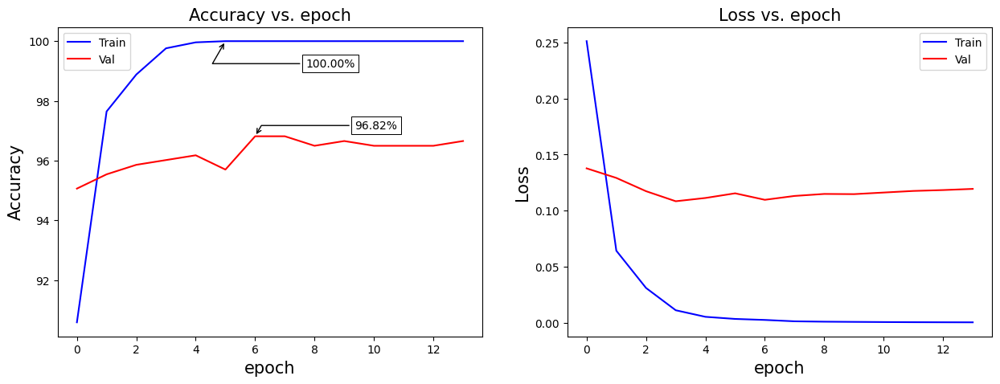

In [ ]:
plot_accuracy_loss(MobileNet_model_fit)

11/11 [==============================] - 2s 141ms/step

Test Accuracy: 89.46%

11/11 [==============================] - 1s 102ms/step


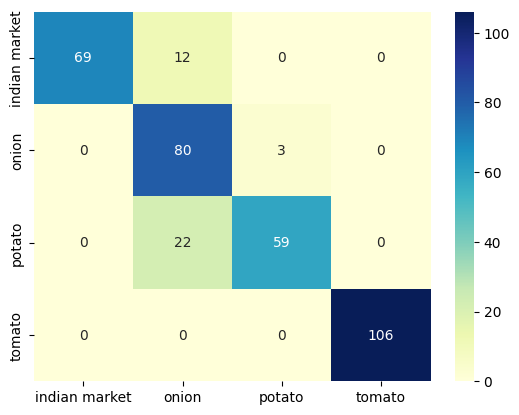

In [ ]:
print_accuracy_stats(MobileNet_model, ckpt_path, test_ds, class_names)
plot_confusion_matrix(MobileNet_model, ckpt_path, test_ds, class_names)

### Plotting the model training metrics

In [ ]:
log_folder = '/content/ninjacart_data/logs/'
%tensorboard serve --logdir={log_folder}

<IPython.core.display.Javascript object>

## **Testing the best model so far**

### Testing on the test set & Random image samples prediction

In [ ]:
# function to plot image given image, its true label and class probabilities (pred_array)
def plot_image(pred_array, true_label, img):
  plt.grid(False)
  plt.xticks([])
  plt.yticks([])

  plt.imshow(img, cmap=plt.cm.binary)

  predicted_label = np.argmax(pred_array)
  if predicted_label == true_label:
    color = 'blue'
  else:
    color = 'red'

  plt.xlabel("{} {:2.0f}% ({})".format(class_names[predicted_label],
                                100*np.max(pred_array),
                                class_names[true_label]),
                                color=color)

# function to plot barplot of class probabilities (pred_array)
def plot_value_array(pred_array, true_label):
  plt.grid(False)
  plt.xticks(range(10))
  plt.yticks([])
  thisplot = plt.bar(range(4), pred_array, color="#777777")
  plt.ylim([0, 1])
  predicted_label = np.argmax(pred_array)

  thisplot[predicted_label].set_color('red')
  thisplot[true_label].set_color('blue')

In [ ]:
def plot_test_results_best_model(model, ckpt_PATH, test_ds):
  true_onehot = tf.concat([y for x, y in test_ds], axis=0)
  true_categories = tf.argmax(true_onehot, axis=1)
  #true_categories = tf.concat([y for x, y in test_ds], axis=0)
  images = tf.concat([x for x, y in test_ds], axis=0)
  model.load_weights(ckpt_PATH)
  y_pred = model.predict(test_ds)
  class_names = test_data.class_names

  # Randomly sample 15 test images and plot it with their predicted labels, and the true labels.
  indices = random.sample(range(len(images)), 15)
  # Color correct predictions in blue and incorrect predictions in red.
  num_rows = 5
  num_cols = 3
  num_images = num_rows*num_cols
  plt.figure(figsize=(2*2*num_cols, 2*num_rows))
  for i,index in enumerate(indices):
    plt.subplot(num_rows, 2*num_cols, 2*i+1)
    plot_image(y_pred[index], true_categories[index], images[index])
    plt.subplot(num_rows, 2*num_cols, 2*i+2)
    plot_value_array(y_pred[index], true_categories[index])
  plt.tight_layout()
  plt.show()

11/11 [==============================] - 1s 98ms/step


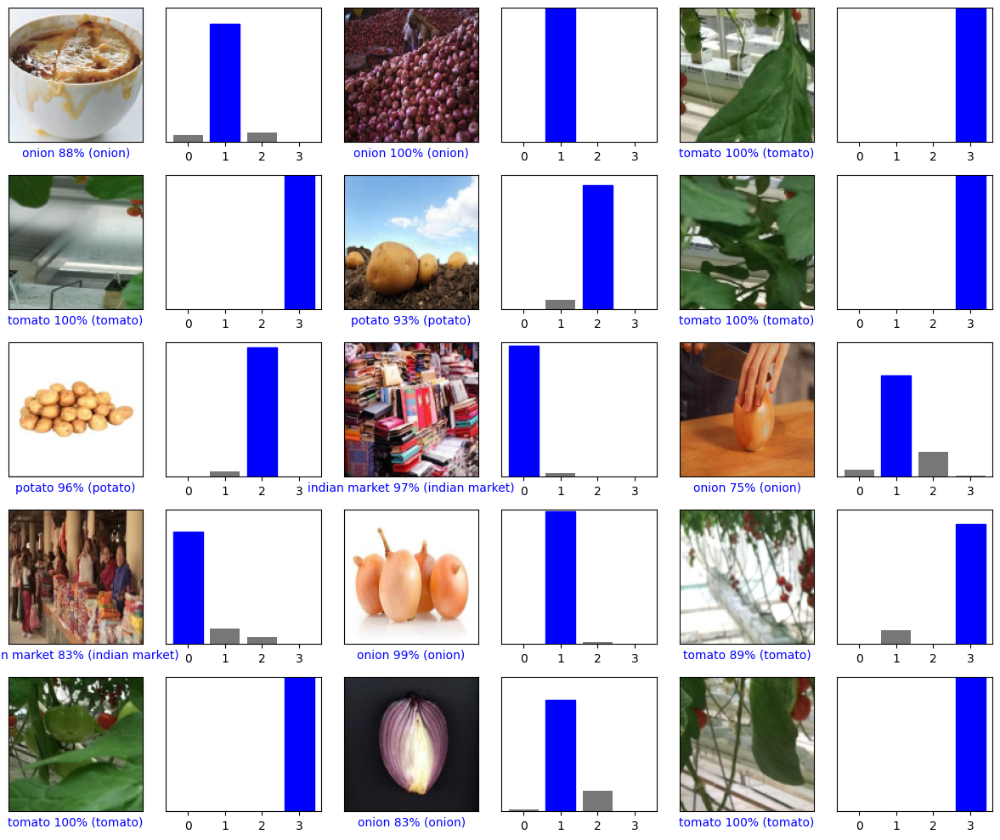

In [ ]:
ckpt_path = '/content/ninjacart_data/checkpoints/model_v5_ckpt/'
model = model_v5
plot_test_results_best_model(model, ckpt_path, test_ds)

11/11 [==============================] - 1s 106ms/step


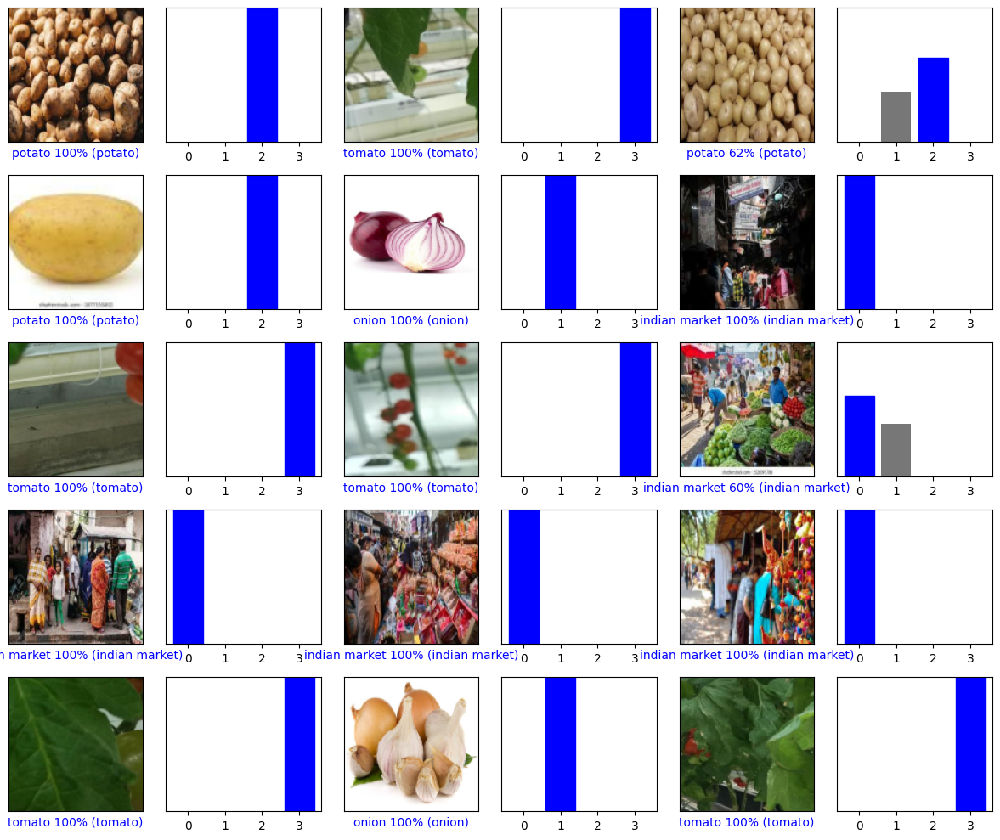

In [ ]:

ckpt_path = '/content/ninjacart_data/checkpoints/model_MobileNet_ckpt/'
model = MobileNet_model

plot_test_results_best_model(model, ckpt_path, test_ds)

### Summary & Insights


- After replacing flatten layer with GlobalAveragePooling2D layer model performance has improved significantly both computationally and accuracy

- After using various techniques of reducing overfitting like bachnormalization, dropout, data augmentation, callbacks we can see there is more improvement in model accuracy

- best test accuracy got 90% with MobileNet model and that is without data augmentation

- best test accuracy got 89% with CNN from scratch model_v5

- some pretrained models has performed poorly on this dataset and some perfomred very well, may some fine tuning is rquired in the some feature extracter layers as well as FC layers in order to increase the accuracy on test data

